<h1><center> 02806 Social data analysis and visualization Spring 22 <br> <br> Final Project Assignment B </center></h1>

- This explainer notebook should contain all the behind the scenes data-analysis stuff, details on the dataset, why you've selected these particular visualizations, explanations methodology, etc.

- Make sure that you use references when they're needed and follow academic standards.

- The notebook should contain your analysis and code. Please structure it into the following sections

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import pmdarima as pmd

from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from statsmodels.tsa.seasonal import seasonal_decompose

import read
import model
import visualize
import utils

%matplotlib inline

global_dpi = 300

# Part 1: Motivation

## 1.1: What is your dataset?

We have three dataset in our final report. They are Poland air quality dataset from [Chief Inspectorate for Environmental Protection](https://powietrze.gios.gov.pl/pjp/current?lang=en), Poland COVID-19 mobility trends from January 13, 2020 to April 10, 2022, which is provided by Apple and got from [here](https://covid19.apple.com/mobility), and <font color='red'>XXXX from link </font>

**Poland air quality dataset**

The time range of air quality data is 22 years, from 2000 to 2021. The data covers all 16 provinces in Poland and is collected from more than 1000 workstations. There are total **15** pollutants in the dataset. There are two measurement mode: automatic - 1 hour (e.g. one-hour measurement results or daily averages from the last period of time) or manual - 24 hours. This dataset includes ~30+ million rows and 850Mb file size. 

**Poland COVID-19 mobility trends dataset** 

The mobility data is collected, processed and made available by Apple Inc. The mobility data is generated by "counting the number of requests made to Apple Maps for directions. The data sets are then compared to reflect a change in volume of people driving, walking or taking public transit". Apple makes such data avaible to aid COVID-19 efforts - as the data may provide insights to health authorities looking for ways to mitigate the spread of COVID-19. The average value from the historical data was used as the initial value (marked as 100 in the Apple data source). The data is in a daily form with time period from January 13, 2020 to April 10, 2022 with 819 rows and 24.3Mb file size.

<font color='red'>**The 3rd dataset**</font>
xxxx

In [2]:
# in order to download pollution data code from script download.py need to be run
df_mobility = read.get_mobility_data() # mobility data
geo_data = read.get_geo_data() # additional data for plotting

stations_metadata = read.read_stations_metadata()

/home/rafaczd/Studia/sem10/SNaDV/project/read.py:127: DtypeWarning: Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("data/mobility_trend_2022_04_10.csv")


## 1.2: Why did you choose this/these particular dataset(s)?

So as we all know, the pandemic hit swift and hard, grounding industries and keeping everyone at home to keep them safe. Studies then went on to praise the by-product of the pandemic: Reduced emissions. But as people stayed home and worked online and the push for smart factories on the rise, to what extent are we looking at emissions dropping, or simply emissions transitioning from one type to another. 

The data from the Chief Inspectorate of Environmental Protection allows us to keen insights into emissions from Poland, one of Europe’s biggest polluters, on a full scale covering each region and over 1000 measurement stations, and the data collected hourly for the past 20+ years of 15 types of pollution such as SO2, CO.

Poland COVID-19 mobility trends dataset somehow shows how the pandemic affects the day-to-day number of human outdoor activities and shows the increase or decrease of people staying at home, both of them might turn into the increase/decrease the potential pollution. 

<font color ='red'> XXXX data.......</font>

Analysing these data we hope to tell a story of how the pandemic has skewed recent trends in types of emissions, and what norms this pandemic has broken.

## 1.3: What was your goal for the end user's experience?
We would like to have our users enjoy reading the information on our Website, and feel the information is clear, direct, and easy to understand. They are convinced by our ideas and would like to share it with others. In addition, they are inspired by how to use data analysis to help the sustainability development and want to explore more details behind the scenes, such as data-analysis stuff in this notebook.

# Part 2: Basic Statistics

## 2.1: Write about your choices in data cleaning and preprocessing

We are using two main sources of the data: pollution data and mobility data. Short description of cleaning and preprocessing of the data is contained under two following headlines.

## Pollution data

### General files structure

The data is available as multiple `.xlsx` files, groupped by years. One file contain measurements for one pollutant in one year. Some pollutants that are mesured in both hourly and daily manner have two files accordingly. One exception to the above rules is the year 2021, because data is not yet verified, so all the measurements are contained in a single file with multiple sheets.

Excell sheets are organized info a tabular format: 
* First column represents measurement time.
* All other columns represent measurements of specific stations.
* First few rows represent a header with generally redundant informations (e.g. type of pollution, which we already know from the sheet name).
* One of the header rows contain measurement station code.
* Each of the rows following header rows contain timestamp and measurements values at this timestamp.

### Handling variability of format

Since size and format of the header changes throughout the timespan of the data, we needed to adjust reading of specific years. 

Some of the files also have a different numeric separator -- they use ',' instead of '.'. 

In a case of 'PM2.5' pollutant, some of the files have names without a dot (i.e. 'PM25').

All of those cases were discovered manually and are handled by a function designed for it.

### Metadata

There are, additionally, files with general statistics and files with metadata about measurement stations. Relevant information for us are: station codes, coordinates of stations, regions in which they are situated and period of their operation. Some of measurement stations have coordinates set as `-999.0`, which we replaced with `np.NaN` values. We do not impute those values since they are not very relevant. In 2015 some stations changed their codes, so we have a special function for joining station codes that handle those cases.

### Reading and tranfofming the data

We created functions for loading the aforementioned data. Since the size of the data makes it impossible to read all the data into the memory at the same time, functions in `read.py` file read the data in chunks, reading only subset of the data specified by user. The most important funcion is `query_data_range()`. We also tranformed the data into a wide format by using `pd.melt()` function. Resulting data has a following format:

* Each row represents a measurement in a specific time, in a specific station, for a specific pollution.
* It consist of five columns: 
    - timestamp -- time and date of measurement,
    - station_code -- place of measurement id,
    - measurement -- value of measurement,
    - pollutant -- type of measured pollution,
    - exposition -- type of measurement (either 24 for daily measurements of 1 for hourly measurement)
* Optionally it may contain region, if data is read with automatic binding of stations.

Such format makes data easier to handle.

## Mobility data

Apple's devices users' data is available as a `.csv` file. It is organized in a tabular format. First few columns contain information about country of measurement and measurement type. Most of the columns represent specific days. We discard all the data from other regions, retaining only two rows about Poland: one contain data about pedestrains mobility, the oder is about people driving. There are no specification of regions for Poland.

We transpose the data, because treating specific days as observations is more convinient for further analysis. We also subtract 100.0 from all the measurements, because this value is treated as the baseline, a mobility of people at the beginning of publishing the data, at the beginning of pandemic. As a result, measurements are contained in an interval $[-100, +\infty)$, where value represents a percentage change relative to the start of pandemic. The resulting data frame contains a following columns:
* date -- date of measurement,
* mobility_walking -- relative change in mobility of people walking,
* mobility_driving -- relative cahnge in mobility of people driving.


## 2.2: Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.

### Restricting pollution data range

TODO: we select only a few regions to analyse, which is justified later; we select only a few pollutants, because they are the most important for car pollution; we select only daily data if possible, because analysing data from each hour is too computationally expensive; we also decided to focus on years 2015-2021, because recent trends are most relevant and again -- that would be too much data

In [3]:
# we select some focus regions, explaination will be shown later
focus_regions = ['MAZOWIECKIE', 'SLASKIE', 'WARMINSKO-MAZURSKIE']
focus_regions_labels = {
    'MAZOWIECKIE': 'Mazowieckie (capital area)', 
    'SLASKIE': 'Śląskie (industrial area)', 
    'WARMINSKO-MAZURSKIE': 'Warmińsko-Mazurskie (green area)',
}
focus_region_colors = {
    'SLASKIE': '#E4572E',
    'WARMINSKO-MAZURSKIE': '#5B8E7D',
    'MAZOWIECKIE': '#FFE46B'
}


# we also select a few pollutants and their corresponding exposition times
selected_pollutants = ['CO', 'NO2', 'NOx', 'SO2', 'O3', 'PM10', 'PM2.5']
selected_pollutants_expositions = [1, 24, 1, 24, 1, 24, 24]

# selected range of years
focus_years = list(range(2015, 2022))

### Visualizing stations on the map of Poland

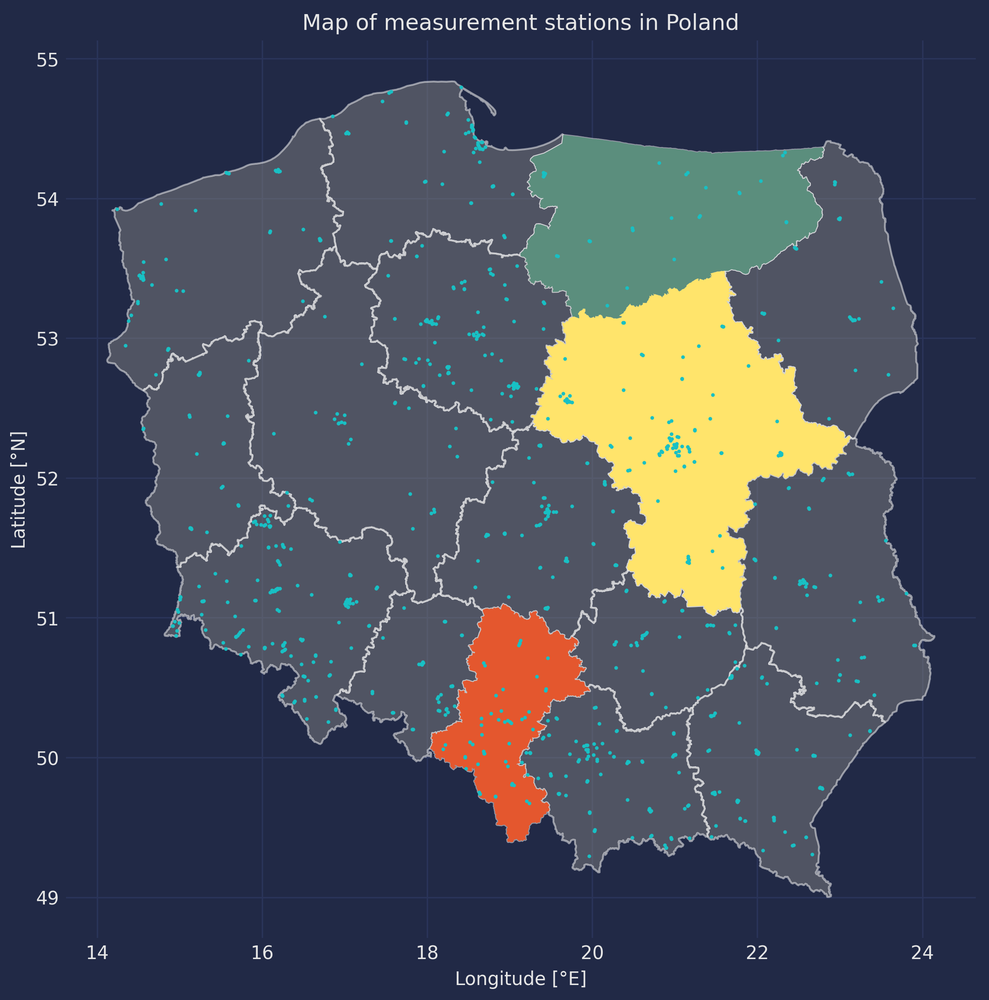

In [4]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, ax = plt.subplots()
    geo_data.plot(ax=ax, edgecolor='white', color='grey', alpha=0.5)
    for region in focus_regions:
        geo_data[geo_data.region == region].plot(color = focus_region_colors[region], ax=ax)
    ax.scatter(stations_metadata.longitude, stations_metadata.latitude, s=1)

    ax.set_title('Map of measurement stations in Poland')
    ax.set_xlabel('Longitude [°E]')
    ax.set_ylabel('Latitude [°N]')

TODO: stations aren't uniformly distributed across the country Colors are for selected regions, key to regions is below

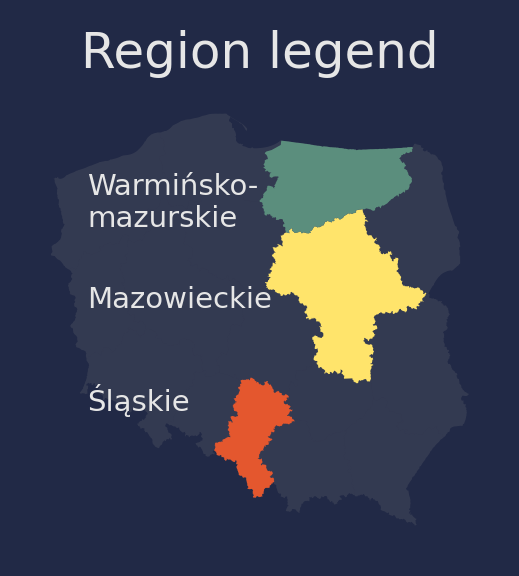

In [5]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context({'figure.figsize': (2, 2), 'figure.dpi': global_dpi}):
    fig, ax = plt.subplots()
    geo_data.plot(ax=ax, color='grey', alpha=0.2)
    for region in focus_regions:
        geo_data[geo_data.region == region].plot(color = focus_region_colors[region], ax=ax)
    
    for x, y, s in zip([15, 15, 15], [54, 52.4, 51], ['Warmińsko-\nmazurskie', 'Mazowieckie', 'Śląskie']):
        ax.text(x, y, s, size=7, verticalalignment='top')
    
    ax.set_title('Region legend')
    ax.set_xticks([])
    ax.set_yticks([])

### Number of stations throughout the years

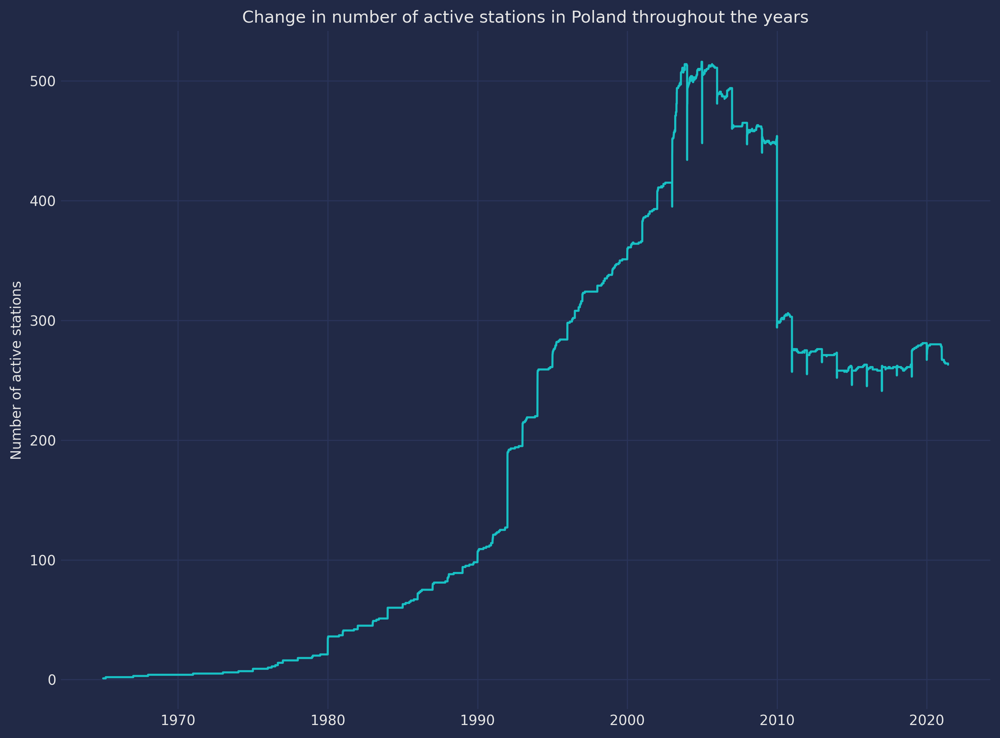

In [6]:
# calculating number of active stations in each day 

stations_activity = pd.melt(stations_metadata[['active_since', 'active_until']]) \
    .sort_values('value')
stations_activity = stations_activity[~stations_activity.value.isna()]
stations_activity['change'] = np.where(stations_activity.variable == 'active_since', 1, -1)
stations_activity = stations_activity[['value', 'change']] \
    .groupby('value') \
    .sum() \
    .cumsum() \
    .reset_index() \
    .rename(columns={'value': 'date', 'change': 'active_stations'})
stations_activity = pd.DataFrame({'date': pd.date_range('1965-01-01', '2021-06-02')}) \
    .merge(stations_activity, on='date', how='left') \
    .ffill()

with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, ax = plt.subplots()
    
    ax.plot(stations_activity.date, stations_activity.active_stations)
    ax.set_ylabel('Number of active stations')
    ax.set_title('Change in number of active stations in Poland throughout the years')

TODO: comment that number of stations changed, but is quite stable in recent years

### Overall statistics of the focus data

Now it is time to see overall statistics of the focus data

In [8]:
# calculate overall data statistics: num of observations, num of NA's, etc

general_data_summary = None

# we load data one by one to avoid memory issues
for pollutant, exposition in zip(selected_pollutants, selected_pollutants_expositions):
    for year in focus_years:
        data = read.query_data_range(year, pollutant, exposition)
        general_data_summary = pd.concat([general_data_summary, pd.DataFrame({
            'pollutant': [pollutant],
            'year': [year],
            'average': [data.measurement.mean()],
            'num_all': [len(data)],
            'num_na': [data.measurement.isna().sum()],
            'num_stations': [len(data.station_code.unique())]
        })])

general_data_summary = general_data_summary.reset_index(drop=True)

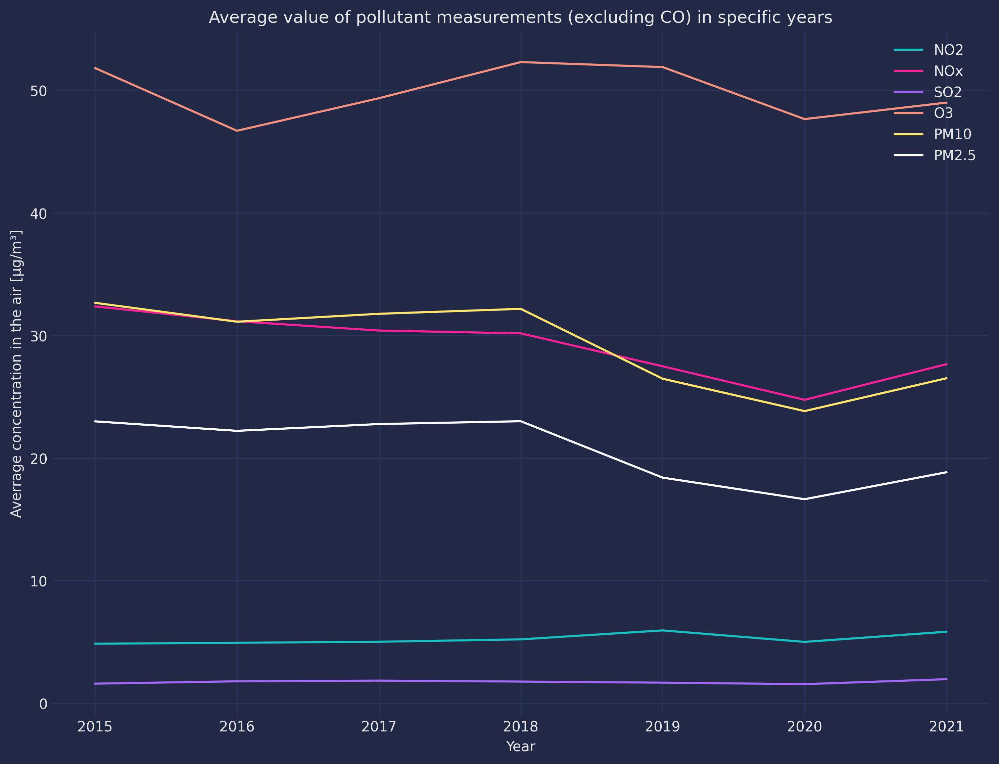

In [9]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, ax = plt.subplots()
    for pollutant in selected_pollutants[1:]:
        data = general_data_summary[general_data_summary.pollutant == pollutant]
        ax.plot(data.year, data.average)

    ax.legend(selected_pollutants[1:])
    ax.set_title('Average value of pollutant measurements (excluding CO) in specific years')
    ax.set_xlabel('Year')
    ax.set_ylabel('Averrage concentration in the air [μg/m³]')

TODO: comment on the values of measurements. CO is on the next plot, because values are even 100-fold higher

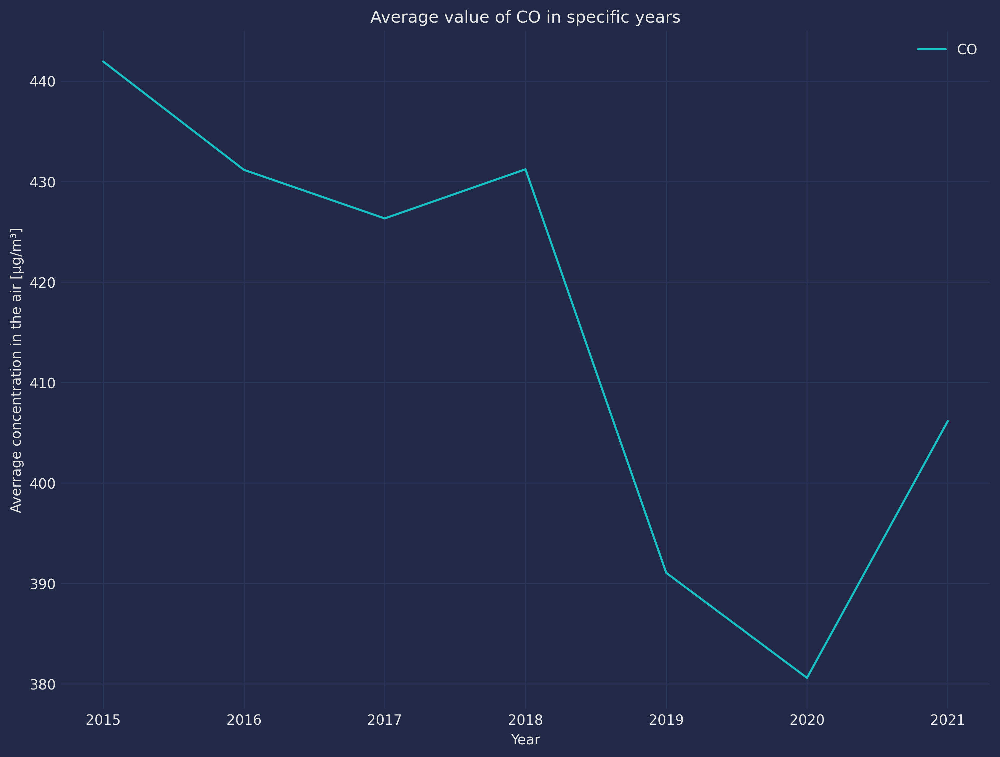

In [10]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, ax = plt.subplots()
    data = general_data_summary[general_data_summary.pollutant == 'CO']
    ax.plot(data.year, data.average)

    ax.legend(['CO'])
    ax.set_title('Average value of CO in specific years')
    ax.set_xlabel('Year')
    ax.set_ylabel('Averrage concentration in the air [μg/m³]')

TODO: write that there is a lot of NA's in the data and this is often consecutive and (that's my guess) iit is because som stations don't operate on some moments throughout the year

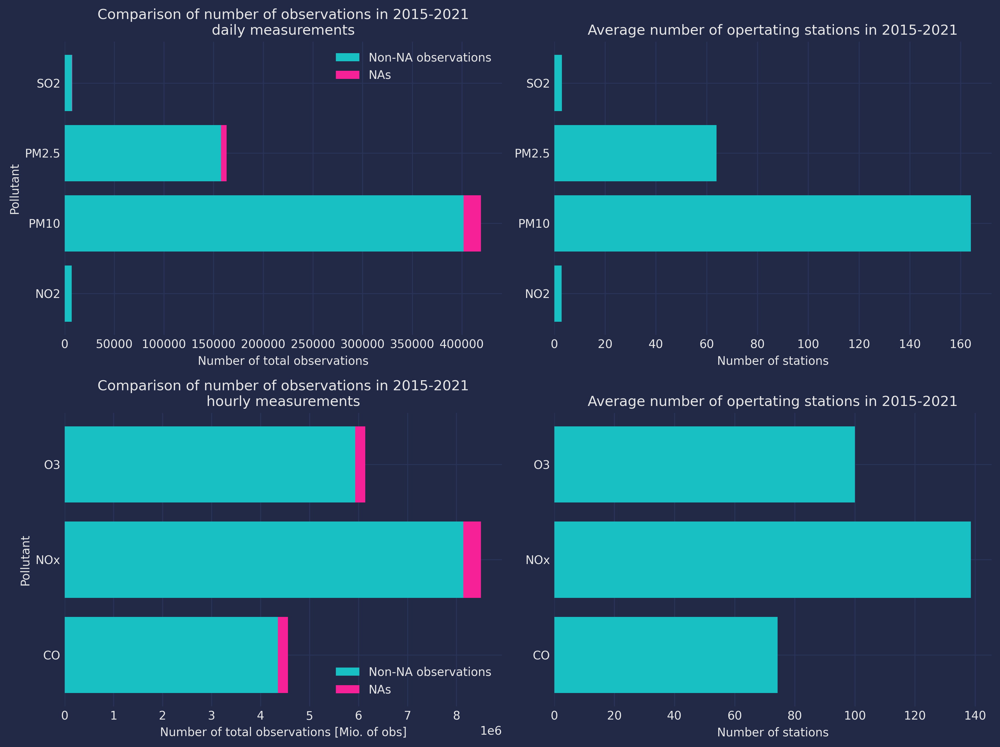

In [11]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, axs = plt.subplots(2, 2)
    data = general_data_summary.groupby('pollutant') \
        .agg({'num_all': np.sum, 'num_na': np.sum, 'num_stations': np.mean}) \
        .reset_index()
    
    for row_id, pollutants_set, pol_lab in zip([0,1], 
                                               [['SO2', 'NO2', 'PM2.5', 'PM10'], ['NOx', 'CO', 'O3']], 
                                               ['daily measurements', 'hourly measurements']
                                              ):
        data_tmp = data[data.pollutant.isin(pollutants_set)]
        axs[row_id, 0].barh(y=data_tmp.pollutant, width=data_tmp.num_all - data_tmp.num_na)
        axs[row_id, 0].barh(y=data_tmp.pollutant, left=data_tmp.num_all  - data_tmp.num_na, width=data_tmp.num_na)
        axs[row_id, 0].set_xlabel(f'Number of total observations{"" if row_id == 0  else " [Mio. of obs]"}')
        axs[row_id, 0].set_ylabel('Pollutant')
        axs[row_id, 0].set_title(f'Comparison of number of observations in 2015-2021\n{pol_lab}')
        axs[row_id, 0].legend(['Non-NA observations', 'NAs'])

        axs[row_id, 1].barh(y=data_tmp.pollutant, width=data_tmp.num_stations)
        axs[row_id, 1].set_xlabel('Number of stations')
        axs[row_id, 1].set_title('Average number of opertating stations in 2015-2021')

    fig.set_tight_layout(True)


TODO: Comment that number of NA when we have so much data is negligible and we can simply discard it. Number of observations is proportional to number of stations

### Timeline of the pandemic and mobility data

It is time to look at the mobility data and see how it aligns with important dates of pandemic in Poland  [Source of the dates is here](https://koronawirusunas.pl/)

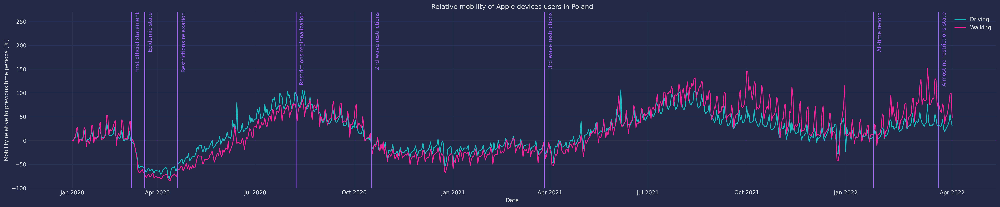

In [12]:
important_dates = {
    '2020-03-08': 'First official statement',
    '2020-03-20': 'Epidemic state',
    '2020-04-20': 'Restrictions relaxation',
    '2020-08-08': 'Restrictions regionalization',
    '2020-10-17': '2nd wave restrictions',
    '2021-03-27': '3rd wave restrictions',
    '2022-01-27': 'All-time record',
    '2022-03-28': 'Almost no restrictions state'
}
date_indices = df_mobility[df_mobility.date.isin(important_dates.keys())].index

fig, ax = visualize.plot_mobility_data(df_mobility, show=False, rc_params={'figure.figsize': (32, 6), 'figure.dpi': global_dpi})

for index, label in zip(date_indices, important_dates.values()):
    ax.axvline(index, color=visualize.get_theme_colors()[2])
    ax.text(index + 3, 270, label, rotation=90, color=visualize.get_theme_colors()[2], verticalalignment='top')

ax.set_ylim(-100, 270)
ax.axhline(0, zorder=-1)

plt.show()

TODO: notice some interesting stuff about the plot

# Part 3: Data Analysis

## 3.1 Overview of the data

The most interesting aspect of the data was to see if air pollution could depend on pandemics. By looking at any plot of pollution throughout the years, we can see, that the data is seasonal, but apparently contains some overall trend. We would like to assess whether this trend stays the same or if it is somehow changed by the pandemic. 

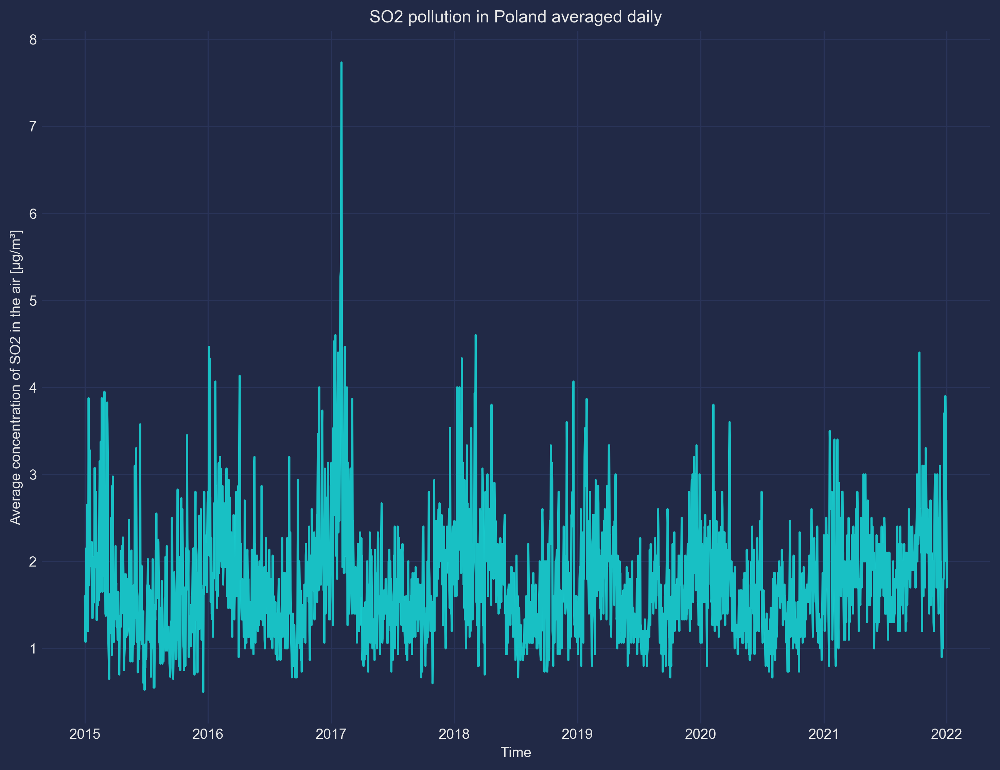

In [13]:
# read all the records about SO2 measurements with daily exposition from focus years
df_SO2 = read.query_data_range(years=focus_years, pollutants='SO2', expositions=24) 
# average the measurements over every day
df_SO2_daily = model.group_and_reindex(df_SO2, 'daily')
# plot the data
visualize.plot_timeline_of_pollution(df_SO2_daily, 'SO2', 'daily')

Daily data contains a lot of noise that can make it difficult to tease information out of a chart. Therefore, we can look at the monthly data.

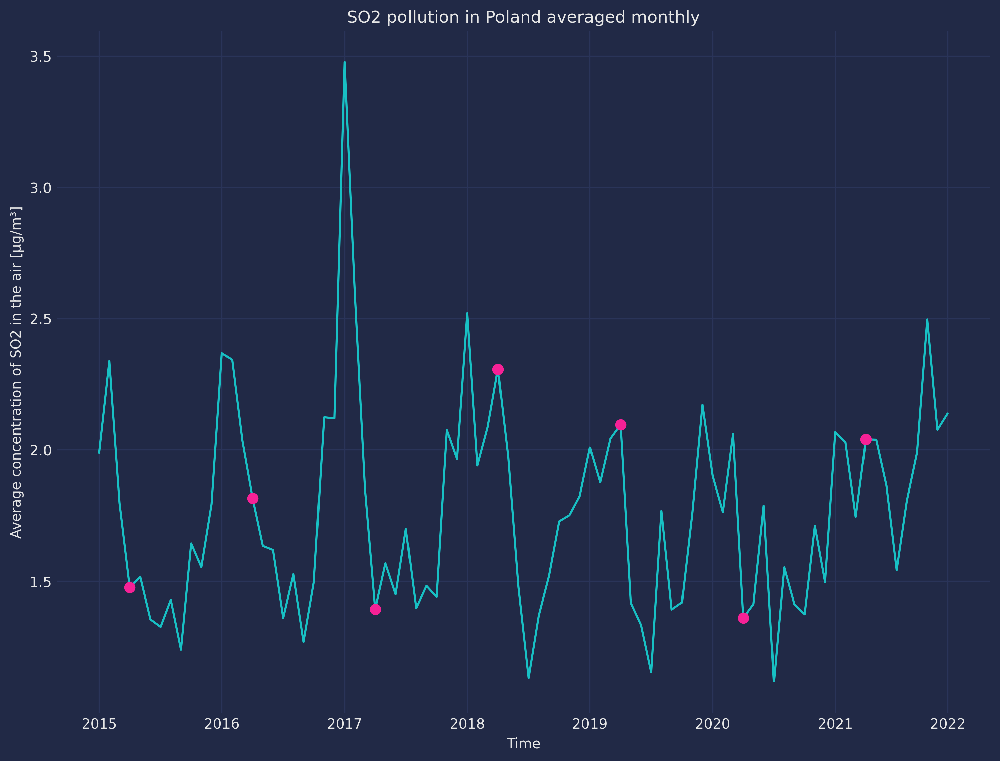

In [14]:
df_SO2_monthly = model.group_and_reindex(df_SO2, 'monthly')
fig, ax = visualize.plot_timeline_of_pollution(df_SO2_monthly, 'SO2', 'monthly', show=False)
# mark Aprils
ax.scatter(range(3, 87, 12), df_SO2_monthly.loc[list(range(3, 87, 12)), 'measurement'], 
           color=visualize.get_theme_colors()[1], zorder=2, s=50)
plt.show()

In the plot we can see that April 2020 presents the value lower that in any of the previous years -- that is the month when full lockdown went on in Poland.

But looking at the charts might not be enough. We want to have a mathematical proof that 2020 and 2021 are odd. The idea is to make a prediction of time series, i.e. predict values in years 2020 and 2021 basing on previous years. But first, we are going to look at general data for different regions.

## 3.2 Visualizing differences between regions for different pollutants

**TODO: Make plots with socio-economico-ecological comparison of Poland and describe them**

**TODO: write about following section**: basically the same as in the poster

In [15]:
focus_pollutants = ['PM10', 'PM2.5', 'CO', 'NOx']
focus_expositions = [24, 24, 1, 1]

df_pol_reg_mon = dict()
for pollutant, exposition in zip(focus_pollutants, focus_expositions):
    data = read.query_data_range(focus_years, pollutant, exposition)
    
    df_pol_reg_mon[pollutant] = {
        region:  model.group_and_reindex(data[data.region == region], 'monthly') 
        for region in focus_regions
    }

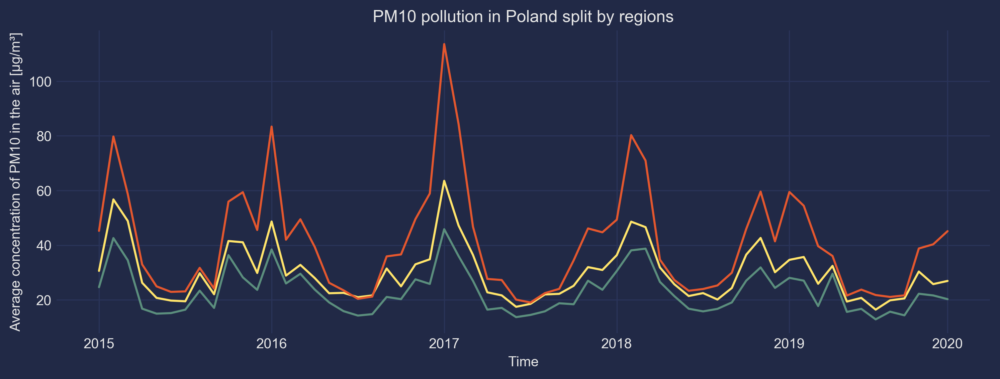

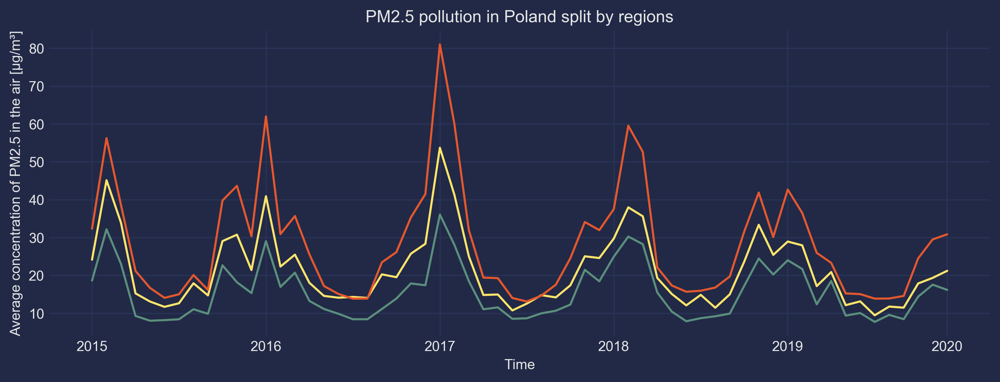

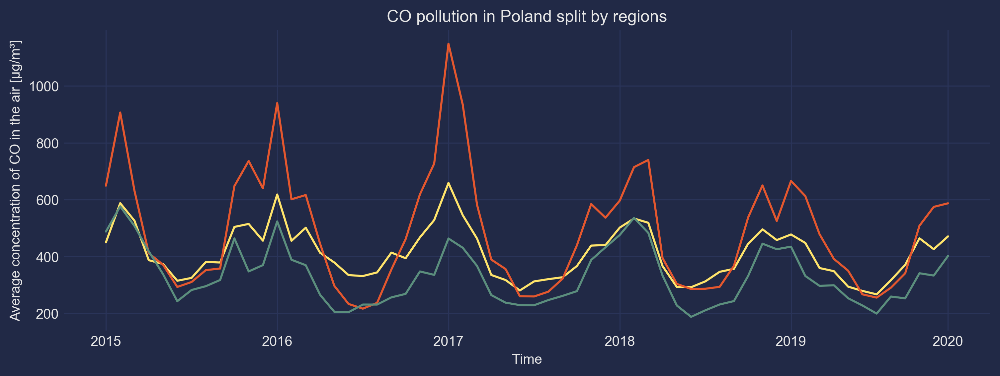

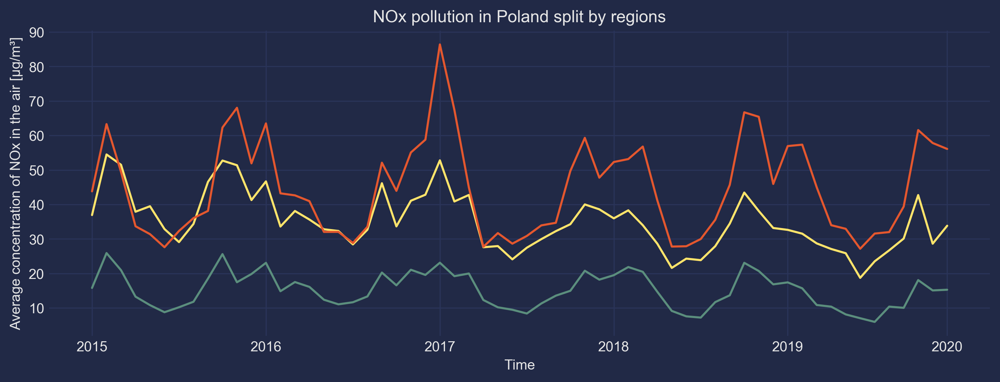

In [16]:
for pollutant in focus_pollutants:
    visualize.plot_timeline_of_pollution_for_regions(
        df_pol_reg_mon[pollutant], focus_regions, focus_region_colors, pollutant,
        rc_params={'figure.dpi': global_dpi, 'figure.figsize': (12, 4)})

**TODO: Describe above plots, make some conclusions**

In [17]:
# aggregating data from the previous plots
df_pol_reg_mon_avgs = None

for pollutant in focus_pollutants:
    for region in focus_regions:
        data = df_pol_reg_mon[pollutant][region]
        data[data.year < 2020]
        df_pol_reg_mon_avgs = pd.concat([df_pol_reg_mon_avgs, pd.DataFrame({
            'pollutant': [pollutant], 'region': [region], 
            'average': data.measurement.mean()})])

df_pol_reg_mon_avgs = df_pol_reg_mon_avgs.reset_index(drop=True)

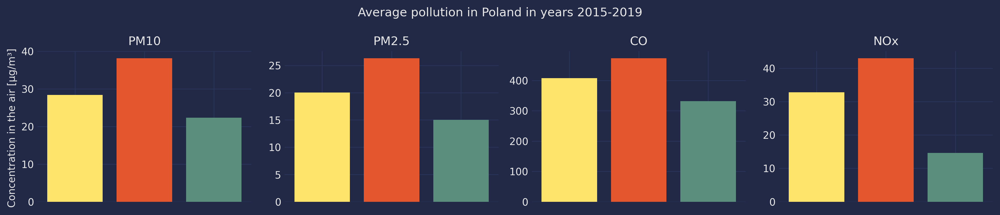

In [19]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context({'figure.figsize': (14, 3), 'figure.dpi': 300}):
    fig, axs = plt.subplots(1, len(focus_pollutants))

    for ax, pollutant in zip(axs, focus_pollutants):
        data = df_pol_reg_mon_avgs[df_pol_reg_mon_avgs.pollutant == pollutant]
        for row in data.index:
            region = data.loc[row, 'region']
            ax.bar(x=region, height=data.loc[row, 'average'], color=focus_region_colors[region])
            ax.set_xticklabels([])
            ax.set_title(pollutant)
            
    axs[0].set_ylabel('Concentration in the air [μg/m³] ')
    
    fig.suptitle('Average pollution in Poland in years 2015-2019')
    fig.set_tight_layout(True)

Barchart with summary of focused pollution types clearly indicates differences between regions

## 3.3 ARIMA preliminary analysis for SO2 data

In order to make a prediction, we decided to use ARIMA model. According to the article [1], ARIMA is a simple and very often sufficient tool to limit simple realtions. Additionally, it does not require immense computational power.

The data we are dealing with is time series: a set of values distributed in time. From the preliminary analysis, the data appears to be seasonal, i.e. there exist some period of time (1 year) which displays similar pattern. We would like to model this data then using AutoRegressive Integrated Moving Average (ARIMA) model. It is actually a combination of three models: AR (autoregressive) I (integrated) MA (moving average) [2, 3]. That means that the value of measurement in the specified time is modelled as depending on the previous values. It also takes into account the seasonality of the data.

TODO: shall we introduce more equations?

The assumption here is that observation $y_t$ in a given moment can be decomposed into parts:

$$y_t = tre_t + sea_t + \epsilon_t$$

where $tre_t$ is the overall trend in the data, $sea_t$ is the component depending on the seasonal change (like here: every year in winter the pollution is higher) and $\epsilon_t$ is some random noise, something which escapes our assumptions. Errors are assumed to be independent and follow normal distribution.

Another important assumption is that $sea_t$ is an an autocorrelated [4] function of time. That means that value in time point $t$ is correlated with its delayed value at time point $t + lag$ for every $t$. The strength of correlation depends on the $lag$ and should be the strongest for the value of $lag$ equal to the length of period.

We are going to check the assumptions for our data using *statsmodels* python package, which automatically decomposes the values. We will also use *pmdarima* package for building ARIMA models and using its utility functions.


* [1]: [Medium Article](https://medium.com/@cdabakoglu/time-series-forecasting-arima-lstm-prophet-with-python-e73a750a9887)
* [2]: [The best Forecast Techniques or how to Predict from Time Series Data -- nice explaination of ARIMA](https://towardsdatascience.com/the-best-forecast-techniques-or-how-to-predict-from-time-series-data-967221811981)
* [3]: [Detailed article on ARIMA on Wikipedia](https://en.wikipedia.org/wiki/Autoregressive_integrated_moving_average)
* [4]: [About autocorrelation in stochastic processes](https://en.wikipedia.org/wiki/Autocorrelation)
* [5]: [statsmodels -- containing function for decomposing and plotting ACF](https://www.statsmodels.org/dev/index.html)
* [6]: [pmdarima -- functions for calculating arima](https://alkaline-ml.com/pmdarima/)


/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


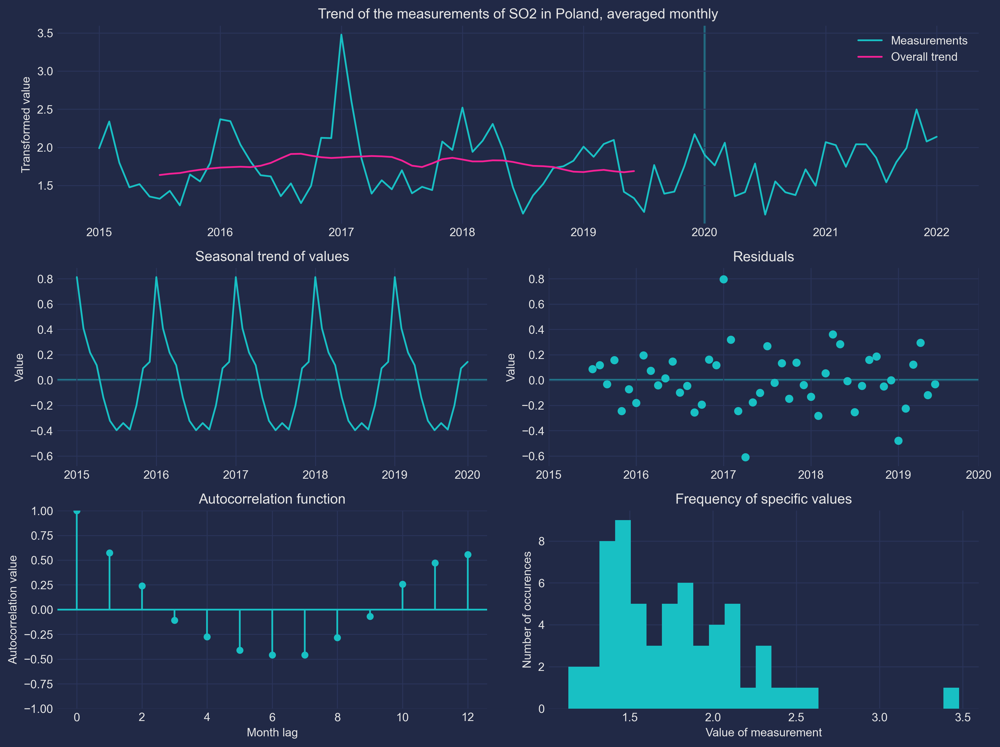

In [20]:
df_SO2_monthly_train, df_SO2_monthly_test = model.train_test_split_on_year(df_SO2_monthly)
decomposition_SO2_monthly = seasonal_decompose(df_SO2_monthly_train.measurement, model='add', period=12)

visualize.plot_full_pre_model_analysis(df_SO2_monthly_train, df_SO2_monthly_test, decomposition_SO2_monthly, 'SO2', 'monthly', transformed=False)

The plot consists of multiple parts. The top one shows the original data with the division into train (pre-2020) and test (2020-2021) datasets. Magenta line indicates the overall trend present in the data, extracted using `seasonal_decompose` function. It was fit only to the training data. Middle left panel displays the seasonality of variables, i.e. calculated seasonal deviation from the trend. We can clearly see that it exists: in winter months pollution is the highest, while in summer it reach lower values. Residuals (in the equation indicated as $\epsilon$ term) are presented in the middle right plot. Although most of them concentrates around 0, there are some notable outliers. Bottom left panel shows autocorelation function. We can see that values that are shifted by 12 months have positive correlation of over 0.5, while measurements shifted by 6 months have negative correlation of almost -0.5 -- that further proves seasonality of the data. Finally, bottom right plot shows distribution of values in the form of histogram. The data is skewed, which means ARIMA model may not be suitable for the data without any transformation.

There is, however, a way of handlng the skewed data. We can try to transform it using some power transformation [7]. We decided to use Box-Cox transformation, suggested by previously menitoned sources. It transforms the data inputs $y_i$ according to the formula:

$${\displaystyle y_{i}^{(\lambda )}={\begin{cases}{\dfrac {y_{i}^{\lambda }-1}{\lambda }}&{\text{if }}\lambda \neq 0,\\\ln y_{i}&{\text{if }}\lambda =0,\end{cases}}}$$

where $\lambda$ is some parameter. In the *pmdarima* package there are functions to automatically transform data and select some $\lambda$ parameter.

* [7]: [Power transformations](https://en.wikipedia.org/wiki/Power_transform#Box%E2%80%93Cox_transformation)

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


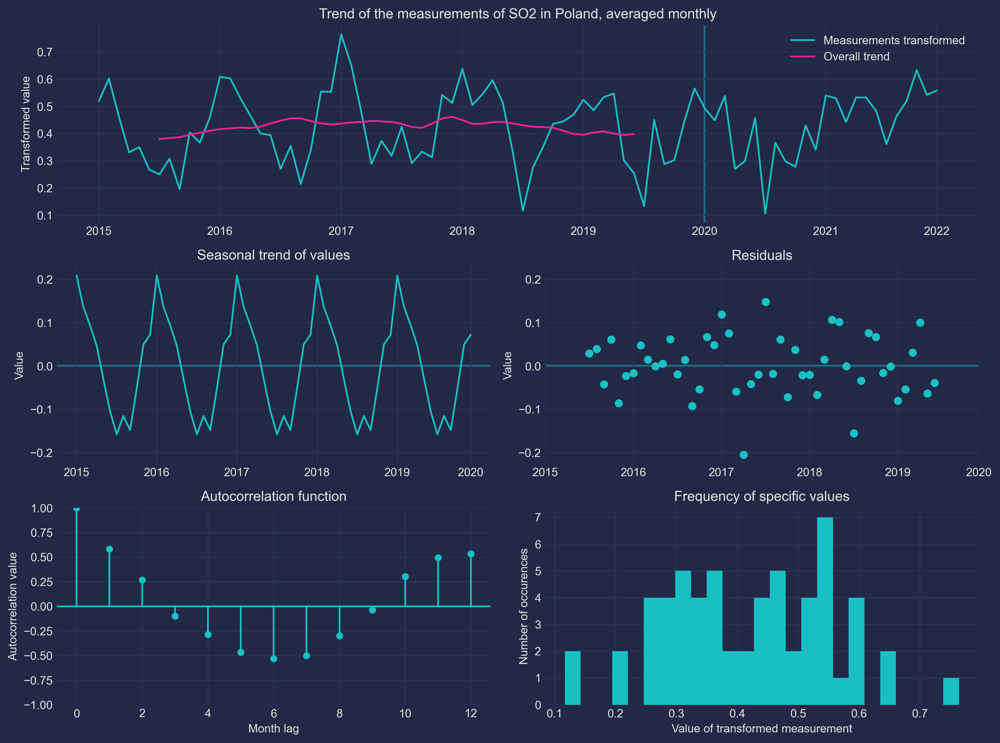

In [21]:
_, df_SO2_monthly_train_tf, df_SO2_monthly_test_tf = model.auto_transform(df_SO2_monthly_train, df_SO2_monthly_test)
decomposition_SO2_monthly_tf = seasonal_decompose(df_SO2_monthly_train_tf.measurement_transformed, model='add', period=12)

visualize.plot_full_pre_model_analysis(df_SO2_monthly_train_tf, df_SO2_monthly_test_tf, decomposition_SO2_monthly_tf, 'SO2', 'monthly', transformed=True)

The above plot shows data after transformations. We can see that the trend is more centralized over the data and the outliers are not that big. Also, distribution of values is more normal. That means that this data is more suitable for training the model. We can do it right now. *pmdarima* automatically selects the best model in its function `auto_arima`

## 3.4 Building SO2 model for transformed data

In [22]:
model_results = dict()
model_results['SO2'] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], model.auto_model(df_SO2, 'monthly', True))

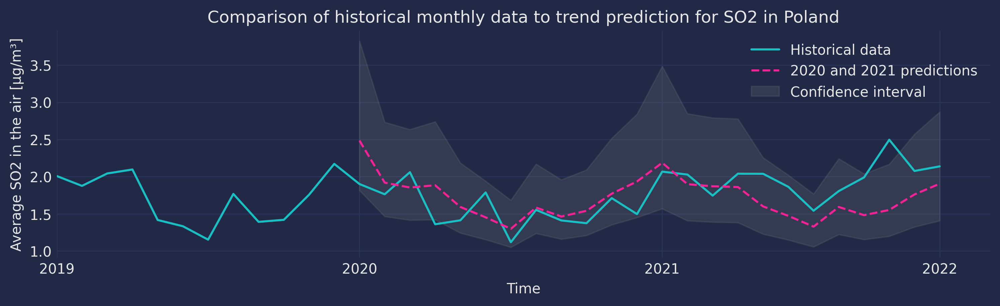

In [23]:
fig, ax = visualize.plot_historical_and_predictions(model_results['SO2'], 'SO2', 'monthly', show=False,
        rc_params={'figure.figsize': (12, 3), 'figure.dpi': global_dpi})
ax.set_xlim(4 * 12, 7 * 12 + 1)
plt.show()

We can see from the plot that the actual historical measurement quite follow the predicted observations with two notable exceptions: April of 2020 and October of 2021.

TODO: maybe add something more?

In [24]:
model.calc_rmse(model.calc_diffs(model_results['SO2']['df_test']))

0.11862932880680802

It is time to compare the data to the data from Apple devices. 

## 3.5 Comparison of deviation from prediction to mobility data

First, we want to reduce the seasonal noise in the data by grouping it into months. Then we can plot it alongside the historical data, predictions and differences.

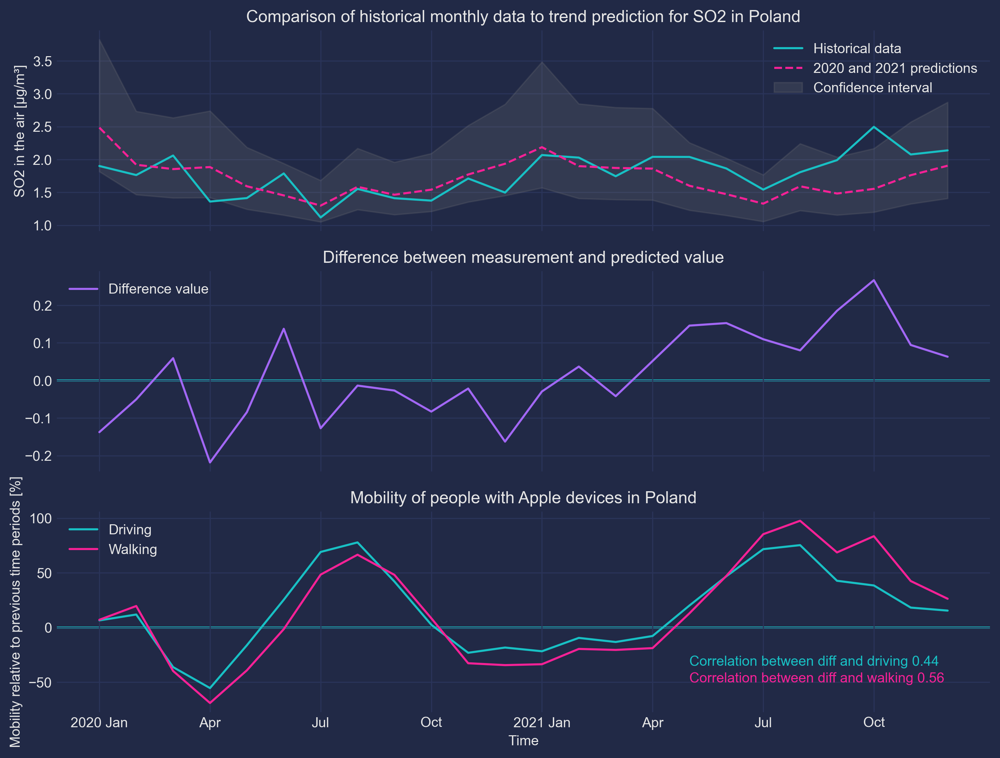

In [25]:
# group monthly mobility data
df_mobility_monthly = df_mobility.groupby(['year', 'month']) \
    [['mobility_driving', 'mobility_walking']] \
    .mean() \
    .reset_index()

visualize.plot_historical_and_predictions_and_mobility(
    model_results['SO2'], df_mobility_monthly, 'SO2', 'monthly')

## 3.6 Prediction for other pollutants

TODO: we do the same for other pollutants

In [26]:
for pollutant, exposition in zip(focus_pollutants, focus_expositions):
    data = read.query_data_range(focus_years, pollutant, exposition)
    model_results[pollutant] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], model.auto_model(data, 'monthly', True))

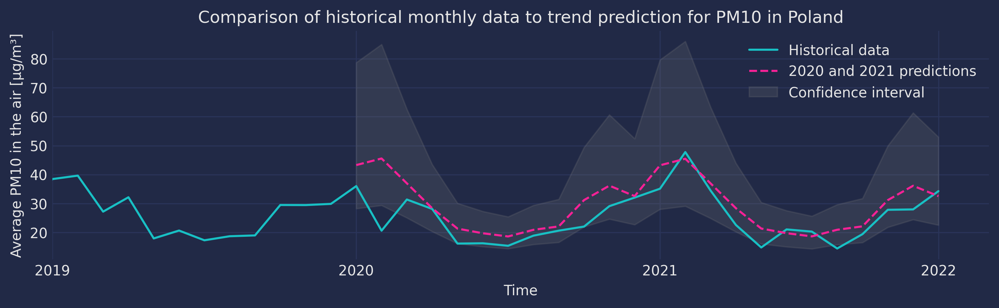

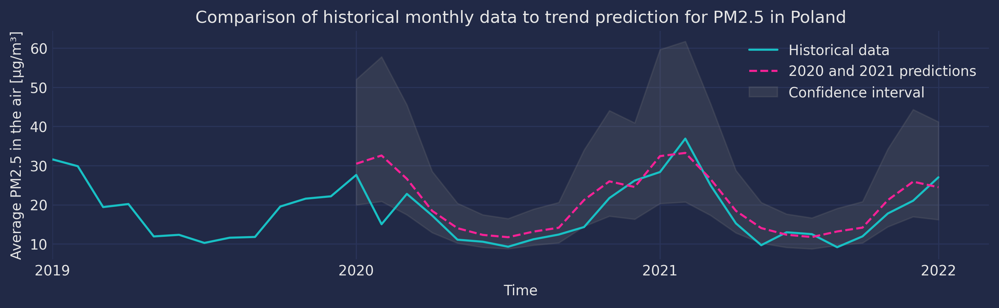

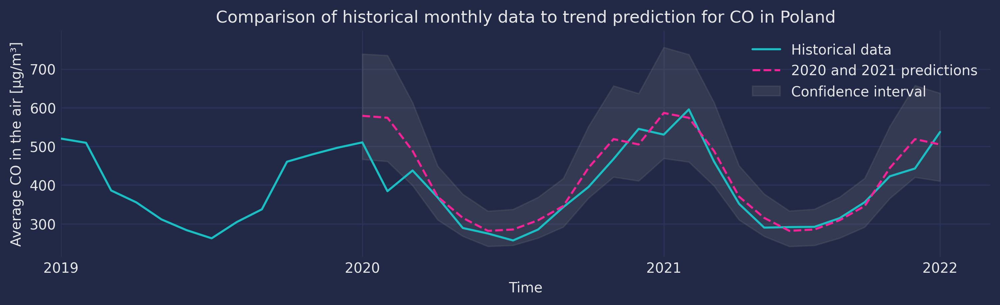

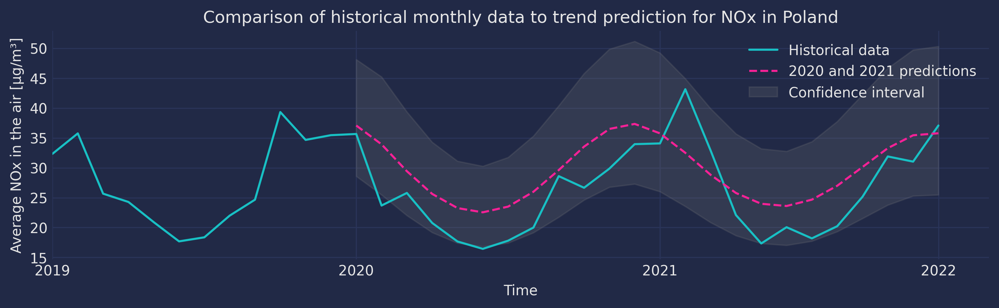

In [27]:
for pollutant in focus_pollutants:
    fig, ax = visualize.plot_historical_and_predictions(
        model_results[pollutant], pollutant, 'monthly', show=False,
        rc_params={'figure.figsize': (12, 3), 'figure.dpi': global_dpi}
    )
    ax.set_xlim(4 * 12, 7 * 12 + 1)
    plt.show()

In [28]:
for pollutant in focus_pollutants:
    print(f'{pollutant} RMSE: {model.calc_rmse(model.calc_diffs(model_results[pollutant]["df_test"]))}')

PM10 RMSE: 0.029822611032164943
PM2.5 RMSE: 0.061328820017775384
CO RMSE: 0.004342805873343895
NOx RMSE: 0.2061084904015698


Some of those modelshave quite godd RMSE, they fit quite good

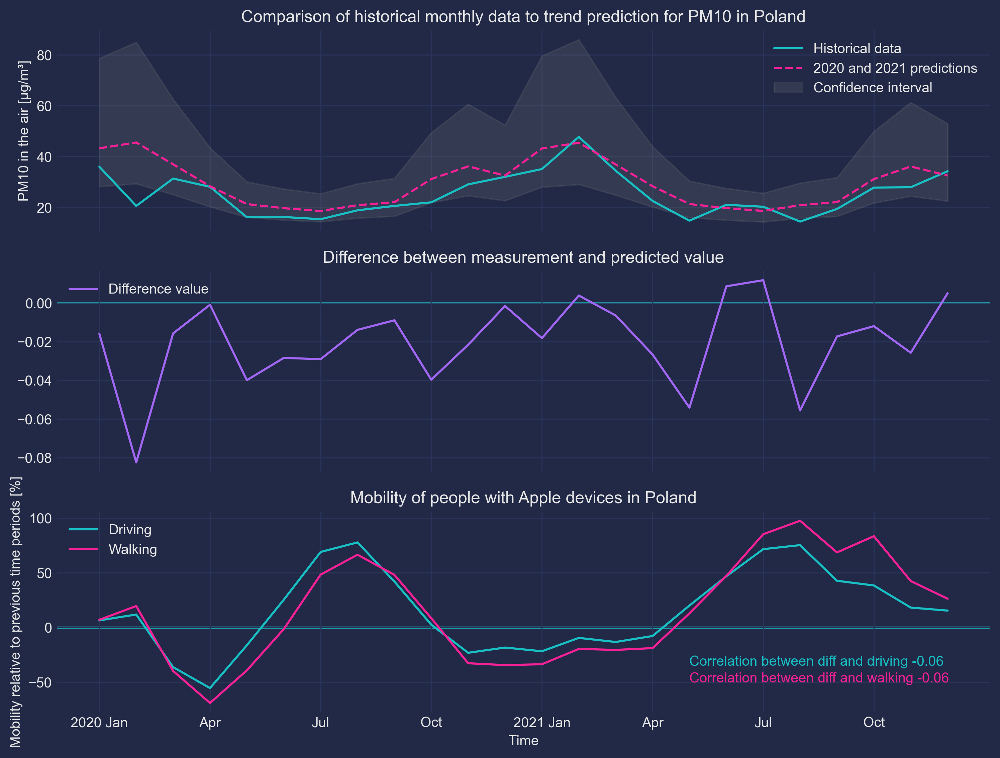

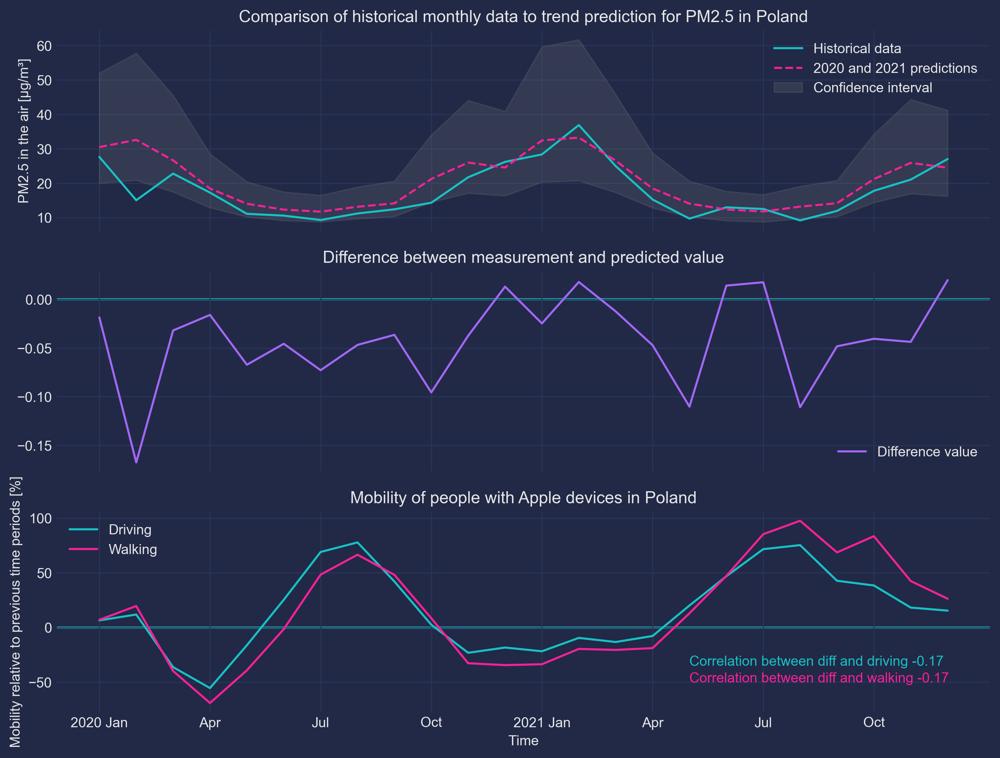

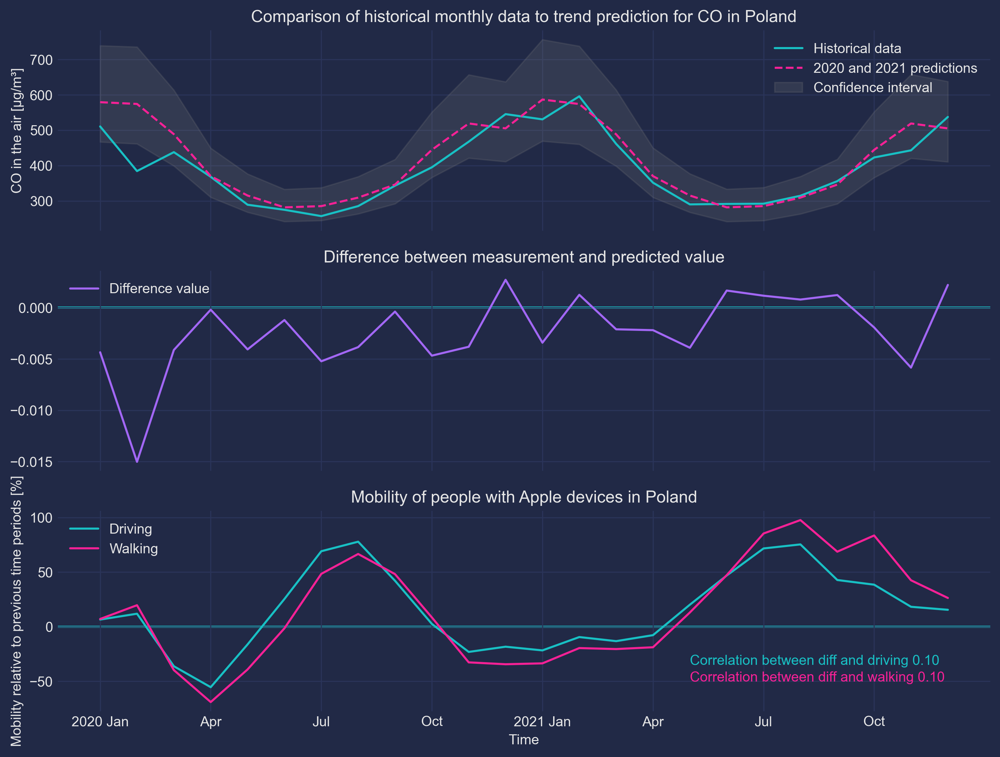

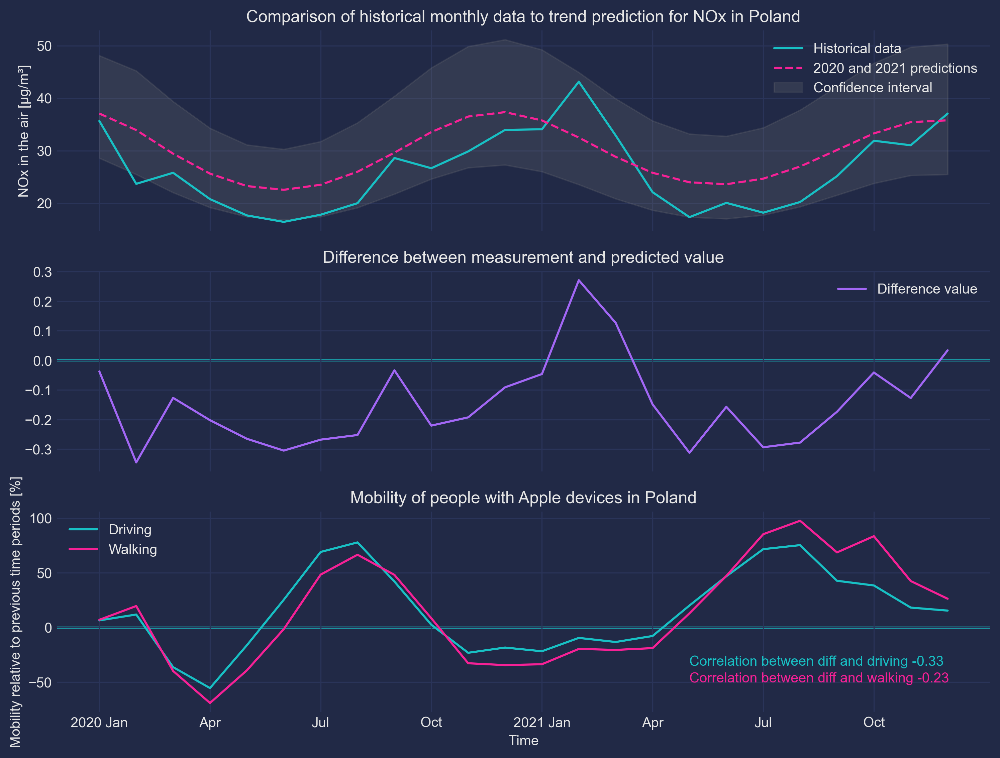

In [29]:
for pollutant in focus_pollutants:
    visualize.plot_historical_and_predictions_and_mobility(model_results[pollutant], df_mobility_monthly, pollutant, 'monthly')

In [30]:
for pollutant in focus_pollutants:
    corr = np.corrcoef(
model_results[pollutant]["df_test"].measurement_transformed - \
model_results[pollutant]["df_test"].prediction_transformed,
df_mobility_monthly[df_mobility_monthly.year.isin([2020, 2021])].mobility_driving
)[0, 1]
    print(f'{pollutant} CORR: {corr}')


PM10 CORR: -0.06397072191663872
PM2.5 CORR: -0.17326013792396794
CO CORR: 0.1029814091501627
NOx CORR: -0.3285407592148029


## 3.7 Analysis of predictions of PM10 for specific regions

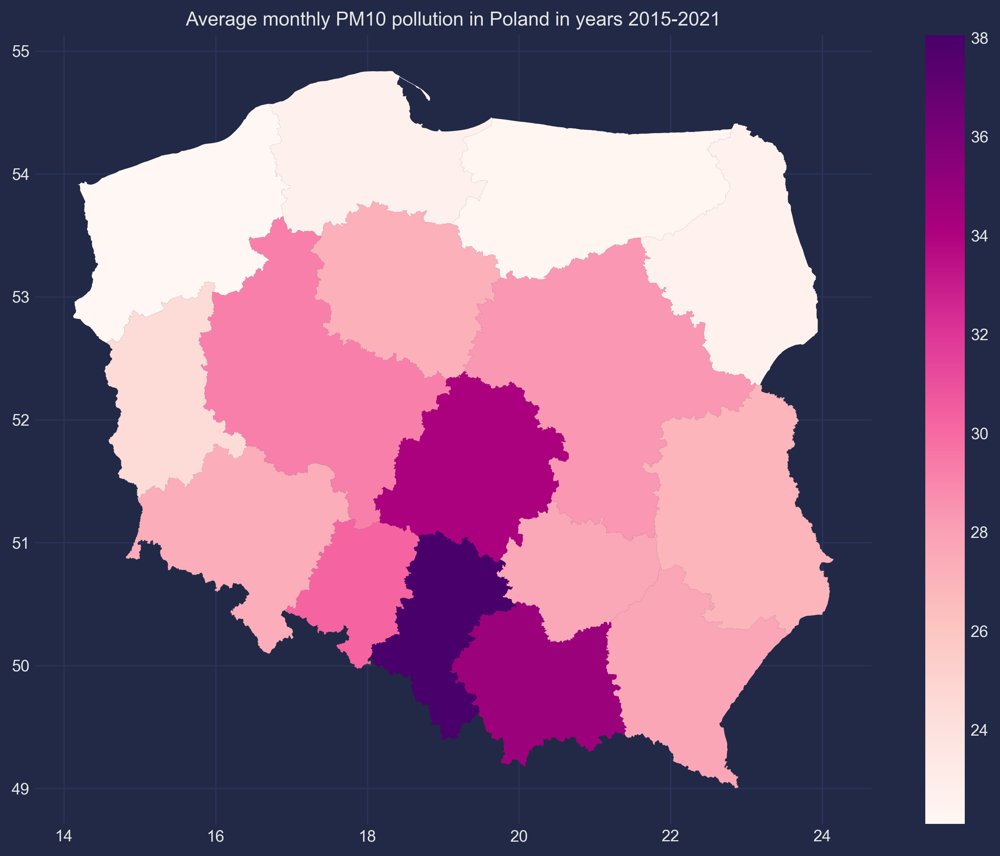

In [31]:
df_PM10 = read.query_data_range(years=focus_years, pollutants='PM10', expositions=24)

avg_PM10_pollution = df_PM10 \
    .groupby(['timestamp', 'region']) \
    .agg(np.nanmean) \
    .reset_index() \
    .groupby('region') \
    .mean() \
    .reset_index()[['region', 'measurement']]
geo_data_PM10 = geo_data.merge(avg_PM10_pollution, on='region')
visualize.plot_map_with_values(geo_data_PM10, 'measurement', 
                               title='Average monthly PM10 pollution in Poland in years 2015-2021')

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


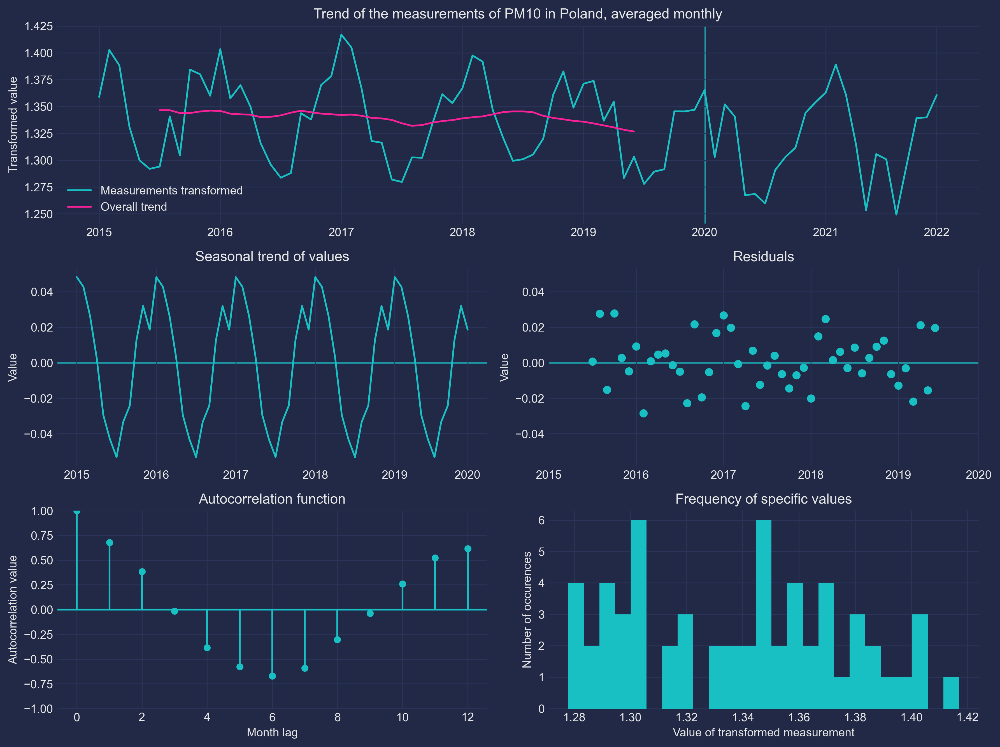

In [32]:
df_PM10_monthly = model.group_and_reindex(df_PM10, 'monthly')
df_PM10_monthly_train, df_PM10_monthly_test = model.train_test_split_on_year(df_PM10_monthly)
_, df_PM10_monthly_train_tf, df_PM10_monthly_test_tf = model.auto_transform(df_PM10_monthly_train, df_PM10_monthly_test)
decomposition_PM10_monthly_tf = seasonal_decompose(df_PM10_monthly_train_tf.measurement_transformed, model='add', period=12)
visualize.plot_full_pre_model_analysis(df_PM10_monthly_train_tf, df_PM10_monthly_test_tf, decomposition_PM10_monthly_tf, 'PM10', 'monthly', transformed=True)

TODO: describe that for monthly data the analysis that we were doing previously show that histogram of values does not follow normal distribution, so model can be quite poor

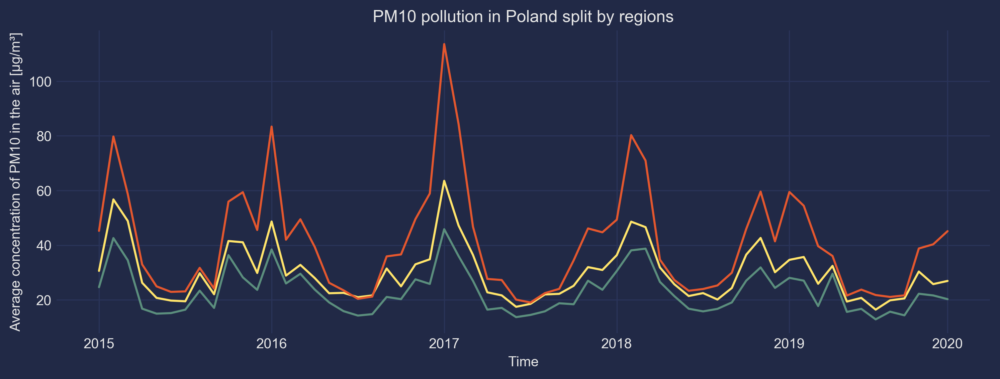

In [33]:
visualize.plot_timeline_of_pollution_for_regions(df_pol_reg_mon['PM10'], focus_regions, focus_region_colors, 'PM10', rc_params={'figure.dpi': global_dpi, 'figure.figsize': (12, 4)})

In [34]:
model_results_regional = dict()
model_results_regional['PM10'] = {
    region: utils.unpack_to_dict(
        ['model', 'df_train', 'df_test'], 
         model.auto_model(df_PM10[df_PM10.region == region], 'monthly', transform=True)) for region in focus_regions}

In [ ]:
visualize.plot_comparison_of_regions(model_results_regional['PM10'], focus_regions, focus_regions_labels, 
                                    'PM10', focus_region_colors, False, rc_params={'figure.figsize': (14, 8), 'figure.dpi': 300})

# Part 4: Genre

## 4.1: Which genre of data story did you use?

**Answers:**


## 4.2: Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?

**Answers:**


## 4.3: Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?

**Answers:**


# Part 5: Visualizations

## 5.1: Explain the visualizations you've chosen.

In [ ]:
# your code might go here

**Answers:**


## 5.2: Why are they right for the story you want to tell?

**Answers:**


# Part 6: Discussion
**Think critically about your creation.**

## 6.1: What went well?

**Answers:**
 - The ideas of story and research question are interested in this project - how the pandamic affect the pollution in Ploland? To investigate this question, we target in the one of the most pollutent countries in the Europe - Poland.
 
 
 - Another thing that went well in this project is, the availability of dataset, such as Polish air quality data from  Chief Inspectorate for Environmental Protection, Apple's mobility trends data, and XXXX. These dataset allows us to closely analyze the polllution and get some insightful findings in terms of the research question.  
 
 
 - Regarding the data analysis, we choose the model of survival analysis to predict the... then compare with what actually happened. The survival analysis, ....In our case, the prediction results is 
 Why this modelling techqniue is fit into our dataset and answering the research question? Because....
 
 
 - In addtion, we add extral dataset like.... and .... to further explore if there are some relationship between people's mobility during pandemic and the pollution in Poland. 

## 6.2: What is still missing? What could be improved? Why?

**Answers:**
- **The bias of dataset**

  In this project, Poland COVID-19 mobility trends dataset is used, which leads to several potentail issues. First, this dataset was collected merely from Apple device, which is around only four percent share of the smartphone market in the Poland. This means the used mobility trends data can only represent part of the People's mobility in Poland, instead of the whole picture. This causes a doubt of reliability of this dataset when employing it to indicate the Ploland mobility trends during the pandemic. Additionally, as the mobility data is in the average of the Poland. The regional data is not available. This impedes us to analyze relationship between the pollution and people's mobility in our target proviences.  


- **Without using other models to predict the pollution**

    Due to the limited time of this project, we used only the technique of the survivial analysis to predict the pollution trends in Poland during COVID-19 period. The accuracy of prediction might be improved by further exploring other models. Exploration of using other models is critical to improve the accruacy, and then to build more credibility/reliablility of the conclusions regarding the research question. 
      

- **The cause of the changing pullution during pandemic can be further explored**

    In this project, we investigate how the poeple's mobility and xxxx affect the pollution trends in Poland during pandemic. Indeed, other factors might be taken into account. For example, due to the country's heavily dependence on coal to power its homes and economy, increase or decrease of the number of people staying at home and economy (such as, less flights and travels during the pandemic) might affect the usage of power, then the pollutions. What's more, the global climate crisis in Poland during the pandemic could also influence the pollution. There are longer-lasting droughts, sudden storms happening in Poland now. These changes would increase the risk of widfires, which is a serious cause of pollution. The extract sunshine can lead some pollutants undergoing chemical reaction, producing smog, and the heavy rainfall could washes out water-soluble pollutants. 

# Contributions
- Who did what?

- You should write (just briefly) which group member was the main responsible for which elements of the assignment. (I want you guys to understand every part of the assignment, but usually there is someone who took lead role on certain portions of the work. That's what you should explain).

- It is not OK simply to write "All group members contributed equally".

# References